In [1]:
!nvidia-smi

Mon Apr 25 00:16:46 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# I. Introduction
> **Name** : Dafa Wiratama  
> **Batch** : Data Science - Batch 09

> Front-end : [imagine.wiratama.tech](http://imagine.wiratama.tech/)
> Back-end : [api.imagine.wiratama.tech](http://api.imagine.wiratama.tech/)

## Background
> This Project was choosen because My Freelance work require me to increase Image Quality and Resolution from video input that was already encoded into MPEG-1 with 1024 kb/s data stream carrying 320x240 pixel resolution and 44100 Hz Audio sampling rate. the data that i got from the client was very low quality because of small resolution and compression that was applied. so i need to develop some algorithms to increase the quality of the Video (Image). but first i need to find a way how upsampling a single image was done in order to understand the problem domain more

> ## Dataset
> because i only have low quality version of the video on my hand i will need to use another dataset to train my model since the model will be learning how to approximate the High quality Image from the low quality Image thats why i will be needing a high quality images at hand, first i download 3 video from the Youtube with Resolution of 1080p then splitting the Video into frames and use them as main target of the model.
>
> Dataset Url : [Google Drive](https://drive.google.com/drive/folders/1KrfZqFwnI5kwJJgnd1m1qBtLPSw_RbfV?usp=sharing)

> ## Limitation
> because of complicated nature of the project i will limit my self in this notebook to only perform inference with single image so we can focus on how the model can do this job. after successfully training the model and generate the high quality image i will be able to perform inference on the low quality video and generate the high quality video frame by frame then stick them together to generate the high quality video. but generating video will be beyond the scope of this project and will be explore more in the next project

> ## Objective
> - Analyze how Image compressiong works
> - Understanding How Tradional Upscaler Works
> - Create Machine Learning Solution for Image Upscaler that can beat Traditional Approach
> - Deploy Single Image Upscaling into Front end so People can Upload and upscale their own Image using the Model

# II. Library Import
> since i will be inferencing thousands of frame from one Video i choose to use Tensorflow 2.0 as the backend framework to better utilize the GPU.
> and other libraries that i will be using are:
>
>> This Notebook was intended to run on `Google Colab` because of the GPU limitation. and because i was using google colab library

In [2]:
import os
import cv2
import shutil
import numpy as np
import tensorflow as tf
from glob import glob
from PIL import Image
from io import BytesIO
from pathlib import Path
from google.colab import files
from matplotlib import pyplot as plt
from time import time


SEED = 13

np.random.seed(SEED)
tf.random.set_seed(SEED)

# III. Data Loading
> ~because of `Google Colaboratory` limitation i will perform Video to Images splitting on my local machine and then upload the images to the Google Colaboratory. because colab only give us 2 CPU cores with 2.Ghz each so to save time i will do it locally~
>
> to get better image loading performance i will use tensorflow io to read the images and store it on the tensorflow Dataset Frame so we can buffer all the images in memory and then feed them to the model with this, to avoid performing any blocking IO operation in the middle of the training that can choke the training performance
>
> and there 3 function that will help me to analyze the image like `img_denormalizer` and `bilinear_upscaler` as our minimum fidelity target image.
> and not perform any input rescaling because i want to embed the scaling into model

> Copy The Dataset from the Google Drive if you want to try training the model you can download the dataset from the Google Drive link above

In [3]:
!cp -r /content/drive/MyDrive/Dataset/image_super_resolution .

> this section dedicated to splitting video into individual frame with frame rate 1/second to avoid repeating to same image because of stationary camera and it yeild less than 1000 sample so we need some way to increase the variance of the dataset

In [4]:
IMAGE_OUTPUT = 'dataset'
VIDEO_SOURCE = 'image_super_resolution/video'

shutil.rmtree(IMAGE_OUTPUT, ignore_errors=True)
Path(IMAGE_OUTPUT).mkdir()


for _input in glob(VIDEO_SOURCE + '/*.mp4'):
    filename = Path(_input).stem
    _output = f"{filename}_%04d.bmp"

    print(f"Splitting {filename}...")
    os.system(f'ffmpeg -y -i "{_input}" -r 1 "{IMAGE_OUTPUT}/{_output}"')

print(f"Total Extracted Images : {len(glob(IMAGE_OUTPUT + '/*'))}")

Splitting yuni_vebra-rembulan...
Splitting yuni_vebra-lewat_angin_wengi...
Splitting misel-akhir_tak_bahagia...
Total Extracted Images : 938


> Image Loader Function 

In [5]:
img_denormalizer = lambda x : np.asarray((x + 1) * 127.5, dtype=np.uint8)
bilinear_upscale = lambda x : tf.image.resize(x, OUTPUT_SHAPE, method='bilinear')

def load_image(path):
    x = tf.io.read_file(path)
    x = tf.io.decode_image(x, expand_animations=False)
    x = tf.image.resize(x, [720, 1280], tf.image.ResizeMethod.GAUSSIAN, preserve_aspect_ratio=True, antialias=False)
    x = tf.cast(x, dtype=tf.uint8)
    return x

# IV. Exploratory Data Analysis (EDA)
> let's start from why image compression was needed and how to revese it by looking on the history and technical perspective

## Image Compression 
> Image compression is a type of data compression applied to digital images, to reduce their cost for storage or transmission. Algorithms may take advantage of visual perception and the statistical properties of image data to provide superior results compared with generic data compression methods which are used for other digital data

>It’s naive to think that there’s just one way to compress an image. There are different methods, each with a unique approach to a common problem, and each approach being used in different algorithms to reach a similar conclusion. Each algorithm is represented by a file format (PNG, JPG, GIF, etc.). For now, we’re going to talk about the methods that are generally used to compress images, which will explain why some of them take up so much less space.

> ### Lossless 
>> When you think of the word “lossless” in the context of image compression, you probably think about a method that tries its hardest to preserve quality while still maintaining a relatively small image size. That’s very close to the truth. As a method, lossless compression minimizes distortion as much as possible, preserving image clarity. It does this by building an index of all the pixels and grouping same-colored pixels together. It’s kind of like how file compression works, except we’re dealing with smaller units of data.

> ### Lossy
>> As the name implies, lossy compression makes an image lose some of its content. When taken too far, it can actually make the image unrecognizable. But lossy doesn’t imply that you’re eliminating pixels. There are actually two algorithms commonly used to compress images this way: transform encoding and chroma subsampling. The former is more common in images and the latter in video.

## Upscaling
> ### Traditional
Basic upscaling is the simplest way of stretching a lower resolution image onto a larger display. Pixels from the lower resolution image are copied and repeated to fill out all the pixels of the higher resolution display.

> Filtering is applied to smooth the image and round out unwanted jagged edges that may become visible due to the stretching. The result is an image that fits on a 4K display, but can often appear muted or blurry.

> ### AI
> Traditional upscaling starts with a low-resolution image and tries to improve its visual quality at higher resolutions. AI upscaling takes a different approach: Given a low-resolution image, a deep learning model predicts a high-resolution image that would downscale to look like the original, low-resolution image.

> To predict the upscaled images with high accuracy, a neural network model must be trained on countless images. The deployed AI model can then take low-resolution video and produce incredible sharpness and enhanced details no traditional scaler can recreate. Edges look sharper, hair looks scruffier and landscapes pop with striking clarity.

> since will process image i will only take some part of the image called patch to we will have more data to train our model in this case i will crop the sample input from 1080 to 128x128 randomly and resize it into 64x64 as input to the model

In [6]:
INPUT_SHAPE = (64, 64)
OUTPUT_SHAPE = (128, 128)

> this is the sample of the framefrom the video that was splitted its quite diverse in color and sharpness since the real world lense cause optical bluring an this is an importand feature to have in the training data since we doest want to shapen a out of focus object


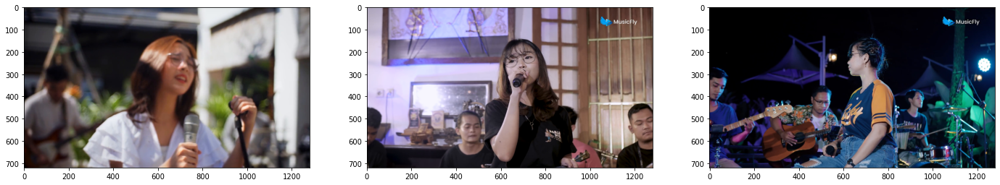

In [7]:
fig, ax = plt.subplots(1, 3, figsize=(8 * 3, 8))

_samples = [load_image(path) for path in glob('dataset/*.bmp')[8:8 + 3]]

for i, img in enumerate(_samples):
    ax[i].imshow(img)

> ## Image Patches

> After Fecthing the frame from the video we can start to split the frame into smaller chunk to save some memory so we can train the model with more diverge batches of input and hope the model will generalize well and not overfitt 

> and this is the sample of the target or the high resolution  
> not much going on this example but you can see the diffrence after seeing the input

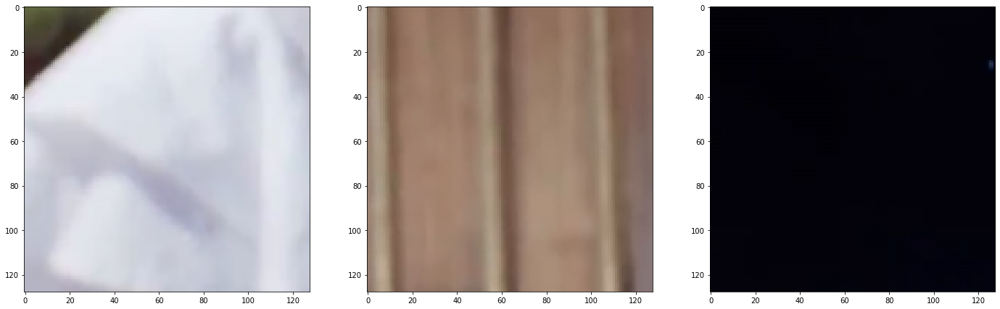

In [8]:
fig, ax = plt.subplots(1, 3, figsize=(8 * 3, 8))

_samples = [tf.image.random_crop(img, [*OUTPUT_SHAPE , 3]) for img in _samples]

for i, img in enumerate(_samples):
    ax[i].imshow(img / 255)

> as yout see the input was quite blocky when compared to the target this is because the information of the pixel image was only quarter of the original input

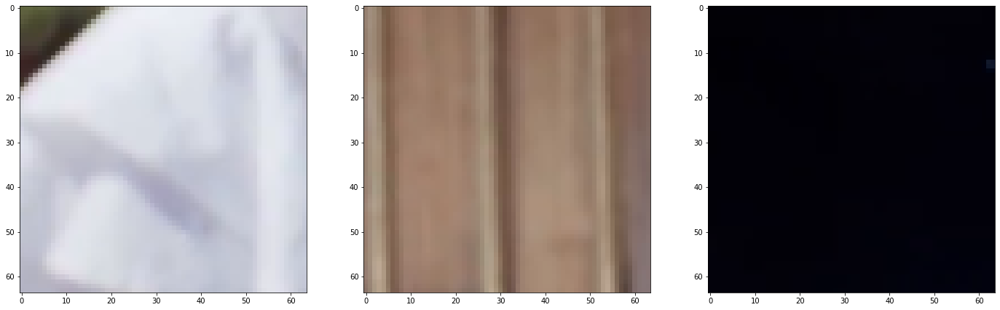

In [9]:
fig, ax = plt.subplots(1, 3, figsize=(8 * 3, 8))

_samples = [tf.image.resize(img, [*INPUT_SHAPE]) for img in _samples]

for i, img in enumerate(_samples):
    ax[i].imshow(img / 255)

> ## Visual Metric

> to better compare the performance of our model i already pick 3 image as anchore image, so we can compare how the model perform across training using the same image

In [10]:
sample_y = np.asarray([tf.image.resize(load_image(x), [256, 256], antialias=True) for x in reversed(glob('image_super_resolution/sample/*.*'))])
sample_x = np.asarray([tf.image.resize(x, [128, 128], antialias=True) for x in sample_y])

> this is the function to plot image input, target, model output and bi-linear upscale output, so we can analyze the performance of our model

In [11]:
def plot_samples(x, y,model=None, model_name=None):
    fig, ax = plt.subplots(3, 4 if model is not None else 3, figsize=(8 * 4, 8 * 3))
    x, y = tf.cast(x, dtype=tf.uint8), tf.cast(y, dtype=tf.uint8)

    for y_idx in range(3):
        ax[y_idx, 0].imshow(x[y_idx])
        ax[y_idx, 1].imshow(y[y_idx])
        ax[y_idx, 0].set_title(f'Input {x[y_idx].shape[:2]}')
        ax[y_idx, 1].set_title(f'Target {y[y_idx].shape[:2]}')

        if model is not None:
            _y = tf.cast(model(x[y_idx:y_idx+1])[0], dtype=tf.uint8)
            ax[y_idx, 2].imshow(_y)
            ax[y_idx, 2].set_title(f'{model_name} {_y.shape[:2]}')
        
        bilinear_sample = tf.cast(tf.image.resize(x[y_idx], y[y_idx].shape[:2]), dtype=tf.uint8)
        ax[y_idx, -1].imshow(bilinear_sample)
        ax[y_idx, -1].set_title(f'Bilinear {bilinear_sample.shape[:2]}')

> this will plot 3 image that i use as anchore i specifically pick this image, so we can see the model perform on the human face because as human we tend to have more sensitive face area

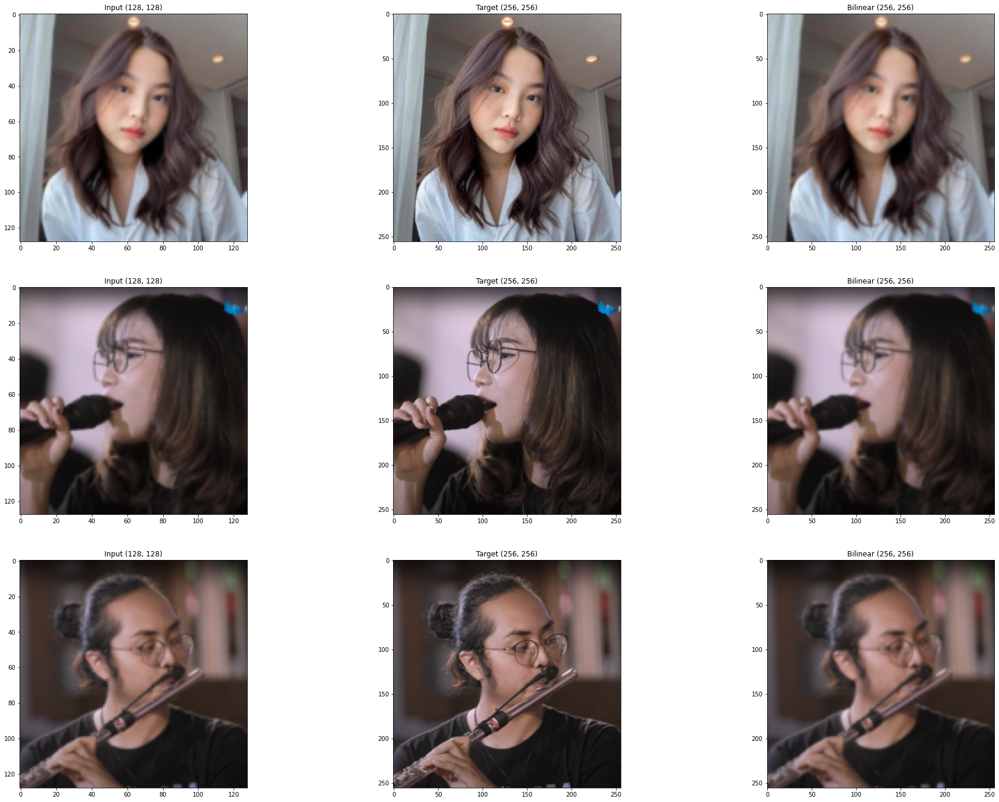

In [12]:
plot_samples(sample_x, sample_y)

# V. Data Preprocessing
> in this section i load all the images path into tf.data frame then shuffling the file because in this state the data still on the string format so shuffling will be done faster, and then we will load the image as tensor and splitting/resizing the image into input and target then cache the data to avoid re-loading the data everytime

In [13]:
def get_patch(x, n_patch):
    patches = []
    for i in range(n_patch):
        patches.append(tf.image.random_crop(x, [*OUTPUT_SHAPE , 3]))
    return tf.stack(patches)

def get_input(y):
    x = tf.image.resize(y, [*INPUT_SHAPE], antialias=True)
    return x, y


ds = tf.data.Dataset.list_files('dataset/*.bmp', seed=SEED).map(load_image).map(lambda x : get_patch(x, n_patch=32)).unbatch().map(get_input).shuffle(1024).cache().prefetch(1024)

> let's visualize the model input and target pair so we can inspect the dataset and make sure no bad logic used in the code from the sample below i can rest asure that the dataset used is correcly configured as expected and we can proceed to train the model using this dataset

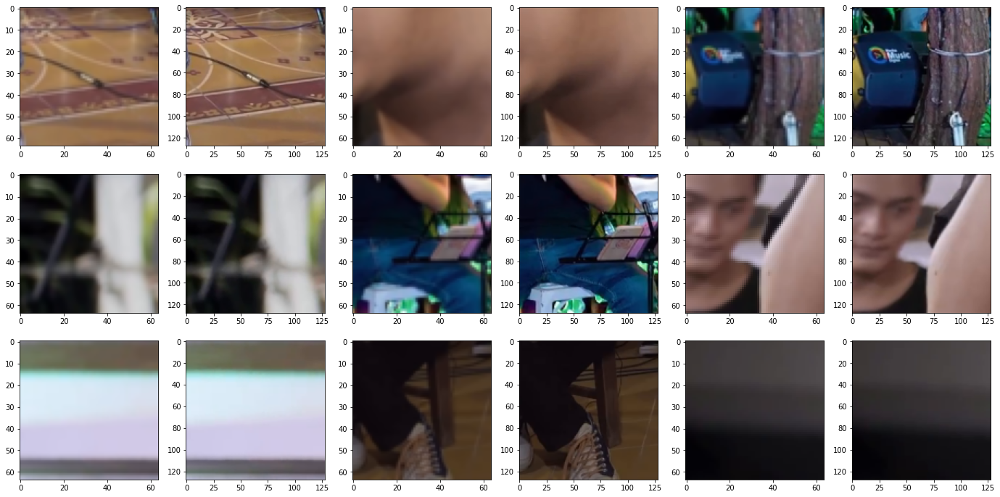

In [14]:
_x = 0
_y = 0

_, ax = plt.subplots(3, 6, figsize=(4 * 6, 4 * 3))

for i, (x, y) in enumerate(ds):
    if i >= 6 * 3 / 2:
        break

    ax[_y, _x].imshow(x / 255)
    ax[_y, _x + 1].imshow(y / 255)

    if _x >= 4:
        _x = 0
        _y += 1
    else:
        _x += 2

> ## Dataset Prformance

> in this section we will test the performance of our data loader in this case tf.data infrastucture why this is important?. this is because i don't want to waste my time just waiting the model training and waiting to load the data from the disk thats why i will try to bechmark the data pipeline that was already created and see if there is any room of performance gain that we can squeeze up

> first we can check the performance of our backbone pipe that hold the entire dataset containing 30_000 pair images and from the dummy benchmark we can see that at first the pipeline was iterating the entire dataset with 30 seconds, but on the second iteration the time required was significantly lower this is in fact because we ulitize lazy loading the dataset when it first call and any subsequence call will be retrieved from the memory instead of from the disk so by adding .cache and .prefetch we just save some of our free time   

In [15]:
def benchmark_dataset(dataset, epochs=4, nstep=None):
    start_test = time()
    for e in range(epochs):
        start = time()
        for i, _ in enumerate(dataset):
            print(f"\rStep {i}", end='')
            if nstep:
                if not i < nstep:
                    break
        print(f"\r\rEpoch {e + 1} - {time() - start:.2f}s")
    print(f"Total Time {time() - start_test:.2f}s")
    return i + 1

In [16]:
n_ds = benchmark_dataset(ds)

Epoch 1 - 35.39s
Epoch 2 - 14.40s
Epoch 3 - 14.56s
Epoch 4 - 14.66s
Total Time 79.02s


> Dataset spliting was done so we can monitor our model performance when it is training so we have some approximation about the model capability and overfitting and here i split the dataset with ration 9:1 and leaving me with 27k images patches to train on

In [17]:
n_train = int(n_ds * .9) 
print(f"Total Patch : {n_ds}, Training Patch : {n_train}")

Total Patch : 30016, Training Patch : 27014


> and here i employ some technique to better add some variation of the dataset using re-shuffling after each epoch was consumed by the model 

In [18]:
train_ds = ds.take(n_train).shuffle(1024 * 8, reshuffle_each_iteration=True)
val_ds = ds.skip(n_train)

# VI. Model Definition
> this model that i build was inspired from the paper [Deep Residual Learning for Image Super-Resolution](https://arxiv.org/abs/1512.03385) this model usually used to solve image to image translation problem, so i hope this model can perform up-scaling task when chained with Upsampling layer

> this model consist of Convolutional Neural Network with residual block and upsampling layer with no Dense layer this was employed because i want the model to have variable input shape and output shape

> the reason model called residual is that skip connection that the model has this kind of connection allow gradient to flow across the model and better information carrying capability from first convolution into final convolution since we want to preserve the input structure to the output images

> since i don't have times to training the model i will only employ 16 residual block and 1 upsampling layer so we can fine tune the model faster

> to up-scale the sample input image i will employ PixelShuffler strategy that will combine the 4 channels of the input image into 1 channel and then upscale the image as this paper suggest [Real-Time Single Image and Video Super-Resolution Using an Efficient
Sub-Pixel Convolutional Neural Network](https://arxiv.org/pdf/1609.05158.pdf)

> and addition of BatchNormalization since it is known that BatchNormalization will help the model to learn faster and better this is because batch normalization will be moving the mean and variance to the batch level that effecting the gradient in this case smoothen the gradient that will help the optimizer to decent faster as this paper suggest [Batch Normalization: Accelerating Deep Network Training by Reducing Internal Covariate Shift](https://arxiv.org/pdf/1502.03167.pdf)

> the model perform preprocessing as part of model layer this is because i want the preprocessing done in the model it self and not in the data loader so we can deploy the model with only single infrastructure and de-normalize the data after the tanh activation at the end of the model so the model will spitting out the image in the range of 0 to 255 so we will only need to cast it into uint8 before saving it

> PReLu activation was employed because its ability to perform activation across channel dimension is known as Spatial-Channel PReLu so the model will have more accurate color output

In [19]:
N_UNITS = 64
KERNEL_SIZE = (3, 3)

def get_generator():

    def residual_block(x, units, filter, padding):
        _x = tf.keras.layers.Conv2D(units, filter, padding=padding)(x)
        _x = tf.keras.layers.BatchNormalization(momentum=.8)(_x)
        _x = tf.keras.layers.PReLU(shared_axes=[1, 2])(_x)

        _x = tf.keras.layers.Conv2D(units, filter, padding=padding)(_x)
        _x = tf.keras.layers.BatchNormalization(momentum=.8)(_x)

        x  = tf.keras.layers.Add()([x, _x])
        return x

    _input = tf.keras.layers.Input(shape=(None, None, 3))
    x = tf.keras.layers.Rescaling(1 / 255.)(_input)
    _x = x = tf.keras.layers.Conv2D(N_UNITS, (3, 3), padding='same')(x)

    for i in range(16):
        _x = residual_block(_x, N_UNITS, KERNEL_SIZE, padding='same')

    _x = tf.keras.layers.Conv2D(N_UNITS, KERNEL_SIZE, padding='same')(_x)
    _x = tf.keras.layers.BatchNormalization()(_x)
    x = tf.keras.layers.Add()([x, _x])

    x = tf.keras.layers.Conv2D(N_UNITS * 4, KERNEL_SIZE, padding='same')(x)
    x = tf.keras.layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(x)
    x = tf.keras.layers.PReLU(shared_axes=[1, 2])(x)

    x = tf.keras.layers.Conv2D(3, (1, 1), padding='same', activation='tanh')(x)
    x = tf.keras.layers.Lambda(lambda x : (x + 1.) * 127.5)(x)
    return tf.keras.models.Model(_input, x, name=f"Generator")

> After the model was created we can start the training process and in this case i will use Adam as optimizer with ExponentialDecay as learning rate scheduler so the model can descending faster as start then learning rate will be decreasing as the training progress

> and for this case of problem i choose MeanSquaredError as the loss function since it will be more forgiving on subpixel error and will not be affected by the noise in the image so the model will be able to learn the image better but this will also make the output to look softer than the original image

> mae was chosen as metric because i want to see how the model perform on pixel-wise presicion

In [20]:
generator = get_generator()
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=256,
    decay_rate=.9
)
generator.optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
generator.compile(loss='mse', metrics=['mae'])

> if you want to see the model architecture you can scroll this cell output and look how many layer this model has

In [21]:
generator.summary()

Model: "Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 rescaling (Rescaling)          (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   1792        ['rescaling[0][0]']              
                                64)                                                       

> This model has 107 layers in total so i will name this model as ResNet107 i think this was good name eventho i still don't know how the model will perform

In [22]:
len(generator.layers)

107

# VII. Model Training
> from the training we can see that the model was capable to learn the image mapping i can say that because the decreasing loss and metric on both validation and training set, but those number does't represent the absolute metric that define if the output is good in the human eye, so we will try to visually analyze the model output then compare it with bi-linear interpolation and the original image

In [23]:
history_mse = generator.fit(train_ds.batch(32), validation_data=val_ds.batch(32), epochs=8)
generator.save('models/generator_mse.h5')

Epoch 1/8
845/845 [==============================] - 194s 219ms/step - loss: 329.3171 - mae: 11.4075 - val_loss: 1110.2983 - val_mae: 14.5335
Epoch 2/8
845/845 [==============================] - 184s 218ms/step - loss: 89.8275 - mae: 5.7177 - val_loss: 736.3621 - val_mae: 9.5844
Epoch 3/8
845/845 [==============================] - 184s 218ms/step - loss: 47.0544 - mae: 4.3904 - val_loss: 51.4416 - val_mae: 5.6074
Epoch 4/8
845/845 [==============================] - 184s 218ms/step - loss: 50.5978 - mae: 4.1011 - val_loss: 36.0526 - val_mae: 4.1784
Epoch 5/8
845/845 [==============================] - 184s 218ms/step - loss: 50.0215 - mae: 3.9771 - val_loss: 82.2260 - val_mae: 5.6645
Epoch 6/8
845/845 [==============================] - 184s 218ms/step - loss: 37.7206 - mae: 3.5416 - val_loss: 39.3917 - val_mae: 3.6516
Epoch 7/8
845/845 [==============================] - 185s 218ms/step - loss: 25.0256 - mae: 3.1842 - val_loss: 21.3371 - val_mae: 2.8496
Epoch 8/8
845/845 [================

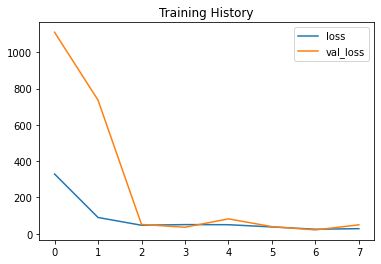

In [24]:
plt.plot(history_mse.history['loss'], label='loss')
plt.plot(history_mse.history['val_loss'], label='val_loss')
plt.title('Training History')
plt.legend()

# VII. Model Evaluation
> Here come the evaluation part of the model
> since this is quite complex problem i will try to visualize the output of the model and compare it with the original image so we will have some idea about what the model was doing

> Some Checkpoint so i can load the already trained model so i can continue the training without losing the progress

In [25]:
generator.load_weights('models/generator_mse.h5')

> as you see from the comparison the model is able to learn something but still it produces soft images because of the mse loss function but it some how in my eye perform better than traditional bi-linear interpolation but some improvement can be done by employing better loss function

> for this case i quite satisfied with the model output so i will save it

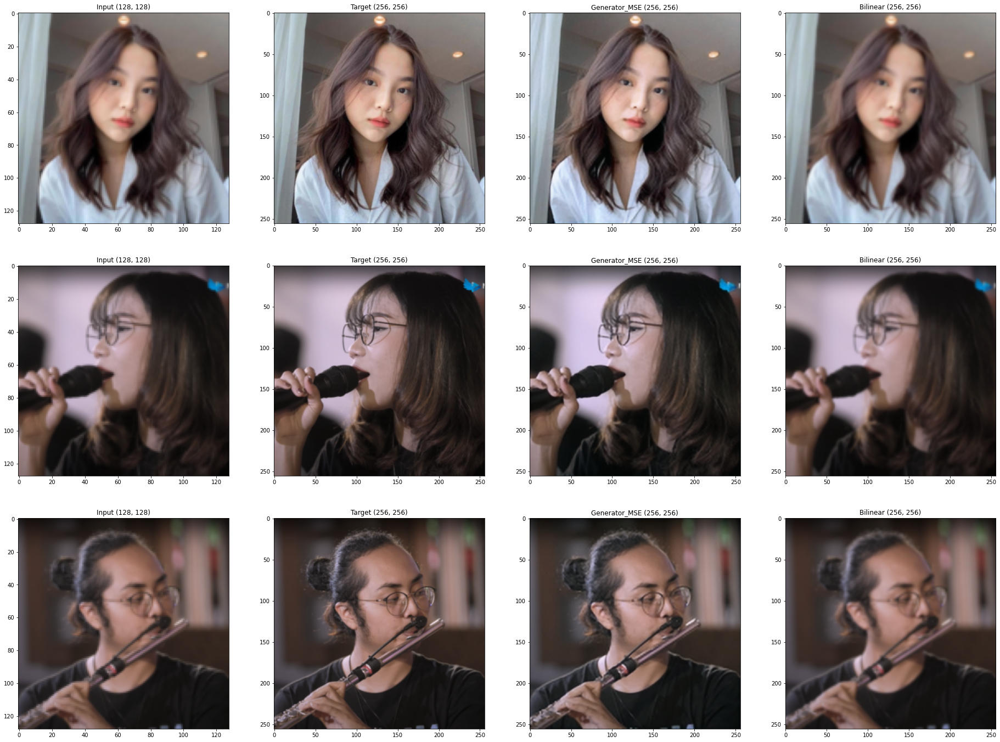

In [26]:
plot_samples(sample_x, sample_y, generator, 'Generator_MSE')

> ## Perceptual Loss / Structural Similarity Loss
> after we see the model mse output there is some improvement over bi-linear interpolation but it lose the small details in the image so i will try to use perceptual loss to improve the model output if you're wondering what is perceptual loss you can check the [The Unreasonable Effectiveness of Deep Features as a Perceptual Metric](https://arxiv.org/pdf/1801.03924.pdf) paper

In [27]:
def show_loss(a, b, loss, label_a=None, label_b=None):
    fig, ax = plt.subplots(1, 3, figsize=(8 * 3, 8))

    _loss = loss(a, b)
    a, b = np.asarray(a, dtype=np.uint8), np.asarray(b, dtype=np.uint8)

    ax[0].imshow(a[0])
    ax[1].imshow(b[0])
    ax[2].imshow((_loss[0] + 1) / 2)

    ax[0].set_title(label_a if label_a else 'A')
    ax[1].set_title(label_b if label_b else 'B')
    ax[2].set_title('Loss')

> before we upgrade our loss function let's see what our current loss is doing

> lets check the bi-linear interpolation output you can compare 1st image with the 2nd image and see how blurry the output of traditional bi-linear interpolation is and from loss perspective you can see that accumulated mse loss is occurring on the edges of the image this is because the bi-linear interpolator is remove edges details because it was applying average filter on the image

> and for the model output there is apparent loss in the middle of the edges this is because the model is not able to learn texture of the image this quite hard to do because the texture information of the image is already lost in the input but we can try to use perceptual loss to improve the model output so i hope the model will learn about some image structure where tu put soft text ture and where to put edge

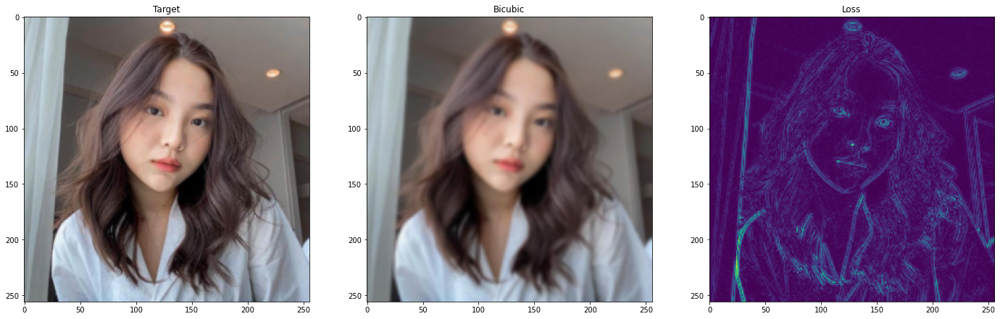

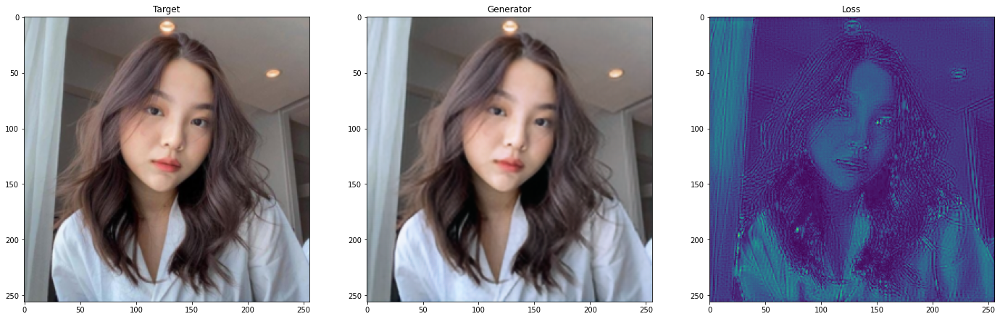

In [28]:
show_loss(sample_y[:1], tf.image.resize(sample_x[:1], [256, 256]), loss=tf.keras.losses.mean_absolute_error, label_a='Target', label_b='Bicubic')
show_loss(sample_y[:1], generator(sample_x[:1]), loss=tf.keras.losses.mean_absolute_error, label_a='Target', label_b='Generator')

> let's setup the perceptual loss function
> perceptual loss employs the VGG model to extract the features of the image and compare them with the target image, what it mean is the model should generate same structure of the target image to decrease the loss of perceptual so i hope the image will be more similar to the target image in this case sharper and more pronounced structure

In [29]:
vgg = tf.keras.applications.VGG19(include_top=False, input_shape=(None, None, 3))
vgg.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

> lets see the output of the VGG model

> from this plot you can see that the output is very abstract so i will probe the model block by block

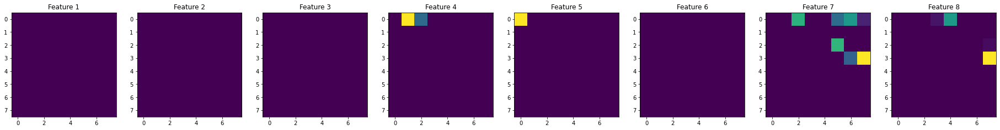

In [30]:
def show_latent(samples, n_sample=8):
    fig, ax = plt.subplots(1, n_sample, figsize=(32, 8))

    for i in range(n_sample):
        ax[i].imshow(samples[:, :, i])
        ax[i].set_title(f'Feature {i + 1}')

show_latent(vgg(sample_y[:1])[0, :, :])

> Utility function to split the model into blocks

In [31]:
def split_model(model, input_name, output_name):
    _model = tf.keras.models.Model(model.get_layer(input_name).input, model.get_layer(output_name).output)
    _model.trainable = False
    return _model

> this is the VGG 1st block i seems to filter the image into outline of the image / edges this will be good for our loss function since i want to have the same structure of the target image in the output

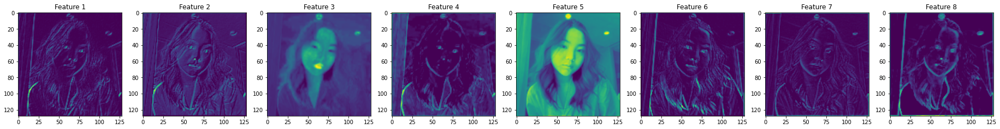

In [32]:
vgg_block_1 = split_model(vgg, 'block1_conv1', 'block1_pool')
vgg_block_1_latent = vgg_block_1(sample_y[:1])
show_latent(vgg_block_1_latent[0, :, :])

> the second block is i think about strong edges like wall edges and lip

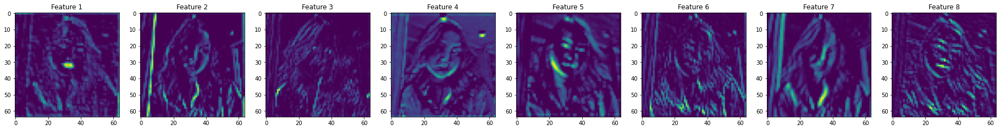

In [33]:
vgg_block_2 = split_model(vgg, 'block2_conv1', 'block2_pool')
vgg_block_2_latent = vgg_block_2(vgg_block_1_latent)
show_latent(vgg_block_2_latent[0, :, :])

> in the third block the model start to show specific feature about the image and i can't  get any idea about the structure of the image so i will stop at 3rd block

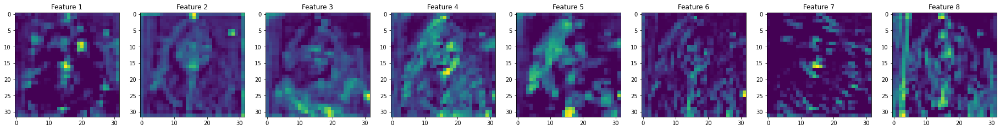

In [34]:
vgg_block_3 = split_model(vgg, 'block3_conv1', 'block3_pool')
vgg_block_3_latent = vgg_block_3(vgg_block_2_latent)
show_latent(vgg_block_3_latent[0, :, :])

> so let's compare the output of the Generator model with the target image along with Bi-linear interpolation  

> you can see the loss of the bi-linear is spread across the image because the perceptual losses is about structure of the image so that's because soft edges are not present in the image
> and for our generated image we can see that there are lesser loss on the image because the model is generating more structure than bi-linear but still have some correction on the edges and this is will be helping us to increase our model performance to i hope the model will be producing sharper images

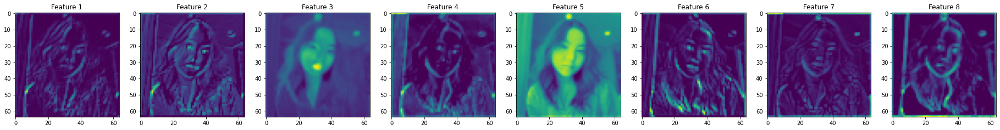

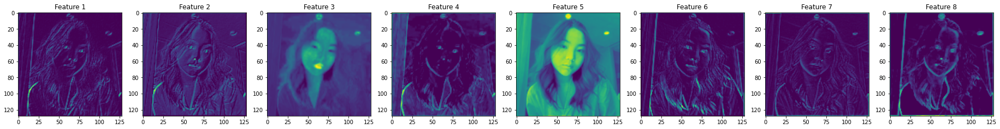

In [35]:
show_latent(vgg_block_1(bilinear_upscale(sample_x[:1]))[0, :, :])
show_latent(vgg_block_1_latent[0, :, :])

> this custom loss function is based on the paper [Perceptual Losses for Real-Time Style Transfer and Super-Resolution](https://arxiv.org/pdf/1603.08155.pdf) and it's based on the paper [A Neural Algorithm of Artistic Style](https://arxiv.org/pdf/1508.06576.pdf)

> and there is annotation @tf.function that will mark the function as a graph so that it will be faster because the tensorflow will not need to create a new computational graph every time the function was called

In [36]:
@tf.function
def perceptual_loss(y, _y):
    y, _y = vgg_block_1(y), vgg_block_1(_y)
    y, _y = vgg_block_2(y), vgg_block_2(_y)
    y, _y = vgg_block_3(y), vgg_block_3(_y)
    loss = tf.keras.losses.mean_squared_error(y, _y)
    return loss

> let's compare the loss of our output with the bi-linear using new loss function
> and there we can see that this loss is caring more about edges rather than color, so we will be chaining the loss function with mean_squared_error so the model will create same color distribution but dictated by the edges

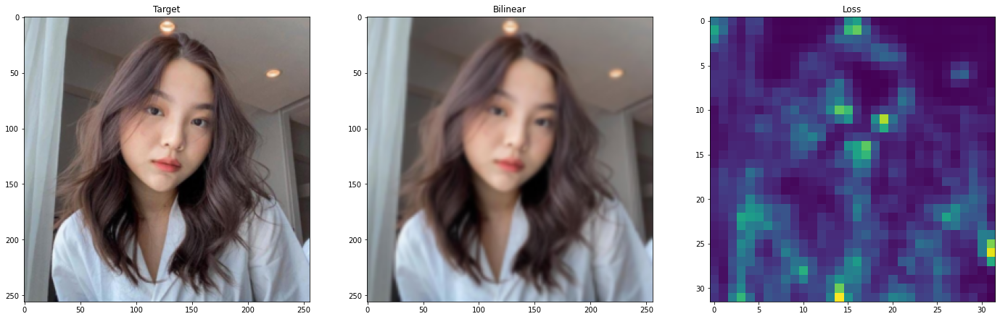

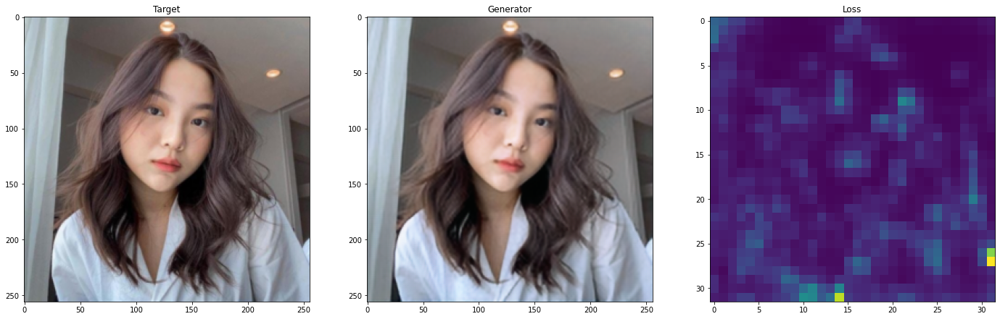

In [37]:
show_loss(sample_y[:1], tf.image.resize(sample_x[:1], [256, 256]), loss=perceptual_loss, label_a='Target', label_b='Bilinear')
show_loss(sample_y[:1], generator(sample_x[:1]), loss=perceptual_loss, label_a='Target', label_b='Generator')

> we need to join the loss function in this case i choose .001 as the lambda value of the SSIM (Structure Similarity) loss function because i want the model to care more about the color accuracy along with the edges and the SSIM loss function is based on the paper [Image Quality Assessment: From Error Visibility to Structural Similarity](https://ieeexplore.ieee.org/document/1284395)

In [38]:
PERCEPTUAL_LAMBDA = 1e-3

@tf.function
def composite_loss(y, _y):
    mse = tf.keras.losses.mean_squared_error(y, _y)
    perceptual = tf.reduce_mean(perceptual_loss(y, _y))
    return mse + (perceptual * PERCEPTUAL_LAMBDA)

> let's load our last model and re-train it with the new loss function

In [42]:
generator.load_weights('models/generator_mse.h5')

> since we employ custom loss function we need to add extra metrics when training to better see what is happening on the model compared to previous training

> but as you see the training starts with 10_000 ish perceptual losses and decreasing into 8_000 this mean our model was learning the structure of the image and still decreasing the mean absolute error loss this mean with learning the structure the model also learning to better recreate output image this was promising progress

In [43]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=256,
    decay_rate=0.96
)

early_stopping = tf.keras.callbacks.EarlyStopping(patience=1, restore_best_weights=True)

generator.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), loss=composite_loss, metrics=['mse', 'mae', perceptual_loss])

history_perceptual = generator.fit(train_ds.batch(32), validation_data=val_ds.batch(32), callbacks=[early_stopping], epochs=8)
generator.save('models/generator_perceptual.h5')

Epoch 1/8
845/845 [==============================] - 261s 304ms/step - loss: 24.8182 - mse: 13.5551 - mae: 1.8308 - perceptual_loss: 11263.0664 - val_loss: 25.7016 - val_mse: 13.1200 - val_mae: 1.5770 - val_perceptual_loss: 12581.5801
Epoch 2/8
845/845 [==============================] - 256s 303ms/step - loss: 22.4404 - mse: 12.3921 - mae: 1.6843 - perceptual_loss: 10048.2744 - val_loss: 24.2192 - val_mse: 12.6194 - val_mae: 1.5483 - val_perceptual_loss: 11599.8145
Epoch 3/8
845/845 [==============================] - 256s 303ms/step - loss: 21.6501 - mse: 12.0766 - mae: 1.6386 - perceptual_loss: 9573.4873 - val_loss: 27.2578 - val_mse: 13.5045 - val_mae: 1.6736 - val_perceptual_loss: 13753.2939


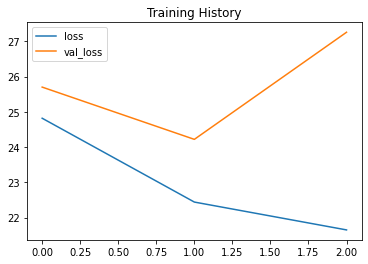

In [44]:
plt.plot(history_perceptual.history['loss'], label='loss')
plt.plot(history_perceptual.history['val_loss'], label='val_loss')
plt.title('Training History')
plt.legend()

> inspecting the image visually we can see more pronounced edges and when you comparing it with the bi-linear output you can see significant difference in the edges let's improve it more and more

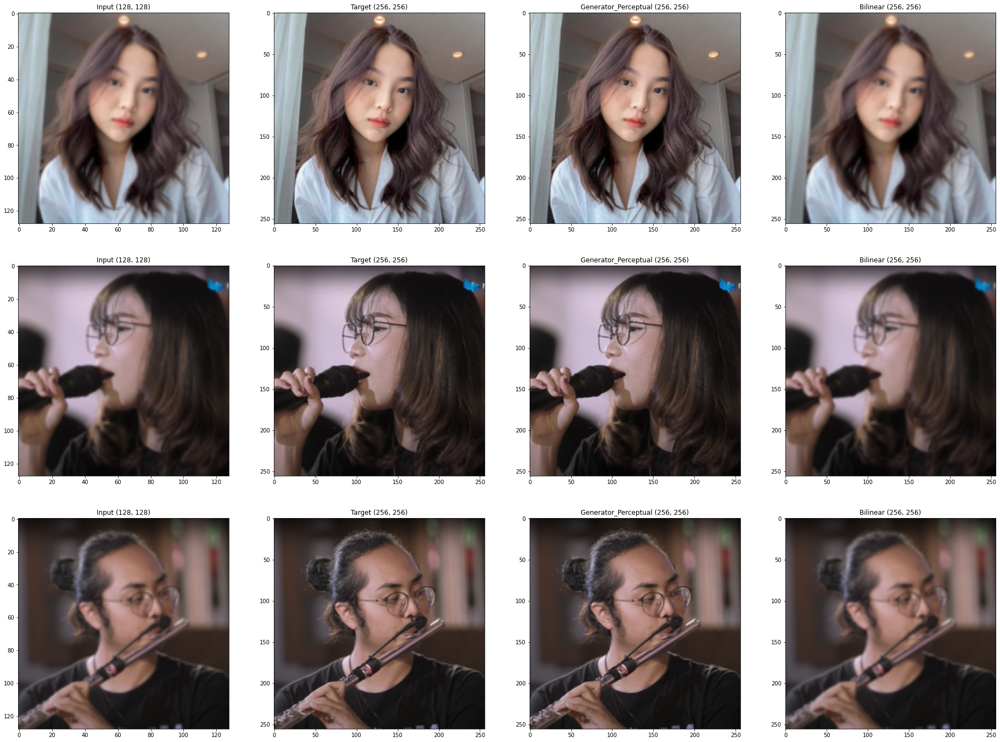

In [45]:
plot_samples(sample_x, sample_y, generator, 'Generator_Perceptual')

> ## Generative Adversarial Networks Approach
> to better improve the model performance we can use adversarial training approach by adversarial training i mean we will create another model that will be trained to distinguish between the real and fake images or in this case our model generated image then applying the new model output as the loss function to the generator model this new model is usually called discriminator by using discriminator the model will learn a way to tricking the discriminator model to think that the generated image is real and by doing that the generator will also learn to generate better images but we are changing the problem of the model before adding discriminator the problem was about minimizing the loss function of the generator model but now we are changing the problem to finding equilibrium between the generator and discriminator model this introduced a new problem that we need 2 equaly capable networks to solve this problem if the discriminator model is too powerfull then the generator will collapse into a single point and if the discriminator model is too powerfull then the generator will be unable to distinguish between the real and fake images this is common problem in GANs. you can read more about this approach in the paper [Generative Adversarial Networks](https://arxiv.org/abs/1406.2661)

> this specific model was choosen because trial and error that is has been doing for a long time, and it is the best model for this problem

> Leaky Relu Was Employed To Prevent The Model From Dying During Training
> Batch Normalization Was Employed To Prevent The Model From Overfitting
> Kernel size was changed to 4x4 to make the model more robust
> No activation function at the end of the model to avoid computing inverse sigmoid because it can lead to numerical instability

In [46]:
def get_discriminator():
    N_UNITS = 64
    KERNEL_SIZE = (4, 4)


    def down_block(x, num_filters, strides=1, batchnorm=True, momentum=0.8):
        x = tf.keras.layers.Conv2D(num_filters, kernel_size=KERNEL_SIZE, strides=strides, padding='same')(x)
        if batchnorm:
            x = tf.keras.layers.BatchNormalization(momentum=momentum)(x)
        return tf.keras.layers.LeakyReLU(alpha=0.2)(x)

    _input = tf.keras.layers.Input(shape=(*OUTPUT_SHAPE, 3))
    x = tf.keras.layers.Rescaling(127.5, -1)(_input)

    x = down_block(x, N_UNITS, batchnorm=False)
    x = down_block(x, N_UNITS, strides=(2, 2))

    x = down_block(x, N_UNITS * 2)
    x = down_block(x, N_UNITS * 2, strides=(2, 2))

    x = down_block(x, N_UNITS * 4)
    x = down_block(x, N_UNITS * 4, strides=(2, 2))

    x = down_block(x, N_UNITS * 8)
    x = down_block(x, N_UNITS * 8, strides=(2, 2))

    x = down_block(x, N_UNITS * 8)
    x = down_block(x, N_UNITS * 8, strides=(2, 2))

    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(1024)(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    x = tf.keras.layers.Dense(1)(x)

    return tf.keras.models.Model(_input, x)

In [47]:
discriminator = get_discriminator()

> Discriminator Model Summary  
> i hope this model was not to powerfull since it has 25 million weight

In [48]:
discriminator.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 conv2d_36 (Conv2D)          (None, 128, 128, 64)      3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_37 (Conv2D)          (None, 64, 64, 64)        65600     
                                                                 
 batch_normalization_33 (Bat  (None, 64, 64, 64)       256       
 chNormalization)                                                
                                                           

> since we're training another model we need another dataset too in this case the dataset will be created from the generator and the target of original dataset and label them accordingly

In [49]:
lr_imgs = []
hr_imgs = []


for element in train_ds.take(1024).as_numpy_iterator(): 
    _x, _y = element
    lr_imgs.append(_x)
    hr_imgs.append(_y)


lr_imgs = tf.convert_to_tensor(lr_imgs)
hr_imgs = tf.convert_to_tensor(hr_imgs)

> after the dataset was generated we can now train the discriminator

> to better maximize the performance we will load our dataset into tf.data infrastructures

In [50]:
_generator = tf.keras.models.load_model('models/generator_mse.h5')

fake_imgs = tf.cast(_generator.predict(lr_imgs, batch_size=8), dtype=tf.uint8)

In [51]:
disc_dataset = tf.data.Dataset.from_tensor_slices((hr_imgs, tf.ones(len(hr_imgs)))).map(lambda x, y : (tf.cast(x, dtype=tf.uint8), y))
fake_ds = tf.data.Dataset.from_tensor_slices((fake_imgs, tf.zeros(len(fake_imgs))))
disc_dataset = disc_dataset.concatenate(fake_ds).shuffle(1024*2).batch(32).prefetch(tf.data.AUTOTUNE)

> lets see our new dataset feature
> as you see the generator is able to generate almost similar images to the original dataset

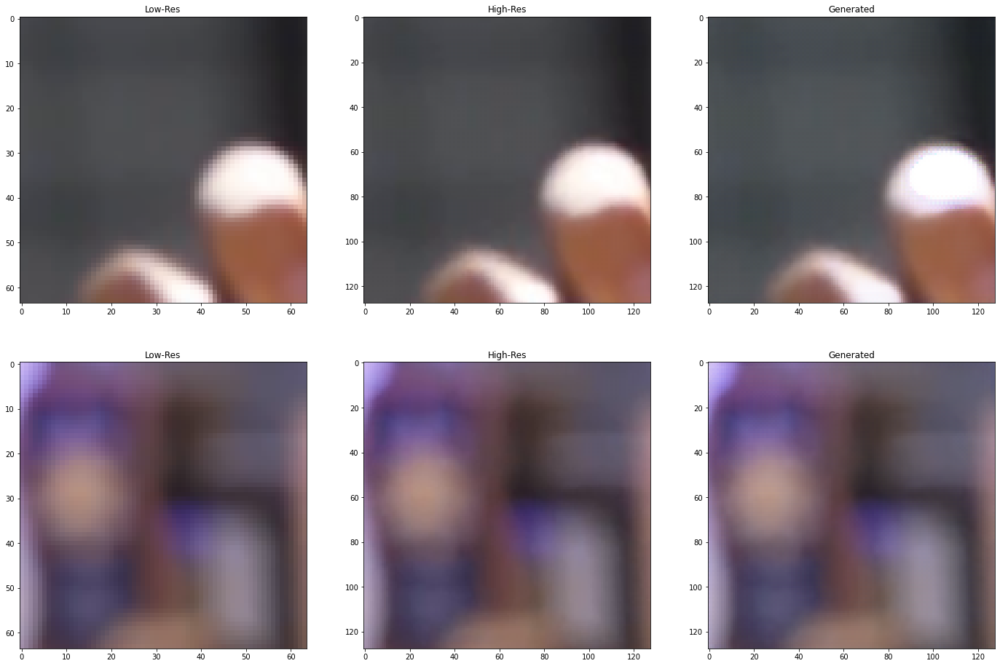

In [52]:
fig, ax = plt.subplots(2, 3, figsize=(8 * 3, 8 * 2))

ax[0, 0].imshow(tf.cast(lr_imgs[0], dtype=tf.uint8))
ax[0, 0].set_title('Low-Res')
ax[0, 1].imshow(hr_imgs[0])
ax[0, 1].set_title('High-Res')
ax[0, 2].imshow(fake_imgs[0])
ax[0, 2].set_title('Generated')

ax[1, 0].imshow(tf.cast(lr_imgs[1], dtype=tf.uint8))
ax[1, 0].set_title('Low-Res')
ax[1, 1].imshow(hr_imgs[1])
ax[1, 1].set_title('High-Res')
ax[1, 2].imshow(fake_imgs[1])
ax[1, 2].set_title('Generated');

> since we not have activation at the end of the discriminator we can use the binary crossentropy loss function with from_logits=True to tell the loss function that the output of the discriminator is a logits

In [53]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

> from the discriminator training the model was able to distinguish between the real and fake images and this is showing good results because the discriminator was able to distinguish between the real and fake images so the generator will be able to generate images that are similar to the real images

In [54]:
discriminator.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss=cross_entropy, metrics=['acc'])
discriminator.fit(disc_dataset, epochs=16)

discriminator.save('models/discriminator.h5')

Epoch 1/16
64/64 [==============================] - 9s 107ms/step - loss: 1.0544 - acc: 0.4819
Epoch 2/16
64/64 [==============================] - 7s 107ms/step - loss: 0.7961 - acc: 0.4946
Epoch 3/16
64/64 [==============================] - 7s 107ms/step - loss: 0.7532 - acc: 0.5156
Epoch 4/16
64/64 [==============================] - 7s 107ms/step - loss: 0.7483 - acc: 0.5117
Epoch 5/16
64/64 [==============================] - 7s 107ms/step - loss: 0.7221 - acc: 0.5273
Epoch 6/16
64/64 [==============================] - 7s 107ms/step - loss: 0.7228 - acc: 0.5303
Epoch 7/16
64/64 [==============================] - 7s 107ms/step - loss: 0.7280 - acc: 0.5200
Epoch 8/16
64/64 [==============================] - 7s 107ms/step - loss: 0.6717 - acc: 0.5815
Epoch 9/16
64/64 [==============================] - 7s 107ms/step - loss: 0.5925 - acc: 0.6821
Epoch 10/16
64/64 [==============================] - 7s 107ms/step - loss: 0.4909 - acc: 0.7598
Epoch 11/16
64/64 [==============================

> since we employing advanced training techniques we need to define custom training loops and custom loss functions this 2 functions are defined below to calculate loss for each model

> one for minimizing loss for discriminator and one for minilizing loss of generator by maximizing loss of discriminator
> can you see the problem now they are competing agains one another and the problem is shifted from minimizing to finding equilibrium of the problem

In [55]:
@tf.function
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

@tf.function
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

> The Custom Training Loop is defined below

> we will be using the tf.GradientTape to calculate the gradients of the loss function
> and performing adversarial training in one step at a time so the model can catch up to the real images and the fake images

> the lambda for the generator loss function is .0001 because we want to make sure that the generator is able to generate images that are similar to the real images but not deviating from the real images/ input

In [56]:
@tf.function
def train_step(x, y):
    x, y = tf.cast(x, dtype=tf.float32), tf.cast(y, dtype=tf.float32)

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(x, training=True)

        real_output = discriminator(y, training=True)
        fake_output = discriminator(generated_images, training=True)

        _mse = tf.keras.losses.mean_squared_error(y, generated_images)
        _perceptual = tf.reduce_mean(perceptual_loss(y, generated_images)) * PERCEPTUAL_LAMBDA
        _gen = generator_loss(fake_output) * 1e-4

        gen_loss = _mse + _perceptual +_gen
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


    history = {}
    history['gen_loss'] = tf.reduce_mean(gen_loss)
    history['gen_pnsr'] = tf.reduce_mean(tf.image.psnr(y, generated_images, 255.))
    history['gen_mse'] = tf.reduce_mean(_mse)
    history['gen_mae'] = tf.reduce_mean(tf.keras.losses.mean_absolute_error(y, generated_images))
    history['gen_perceptual'] = tf.reduce_mean(_perceptual)
    history['gen_disc'] = tf.reduce_mean(_gen)
    history['disc_loss'] = tf.reduce_mean(disc_loss)
    return history

generator.load_weights('models/generator_perceptual.h5')
discriminator.load_weights('models/discriminator.h5')

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

for epoch in range(4):
    print ('\nEpoch : {}'.format(epoch + 1))

    for i, image_batch in enumerate(train_ds.batch(16).take(512)):
        history = train_step(*image_batch)
        print(f"\r\t{i + 1:3d} - Generator Loss : {history['gen_loss']:.4f} - MSE : {history['gen_mse']:.4f}  - MAE : {history['gen_mae']:.4f} - Disc : {history['gen_disc']:.4f} - Perceptual : {history['gen_perceptual']:.4f}, PNSR : {history['gen_pnsr']:.3f}, Discriminator Loss : {history['disc_loss']:.4f}", end="")


Epoch : 1
	512 - Generator Loss : 10.9491 - MSE : 5.7546  - MAE : 1.3683 - Disc : 0.0001 - Perceptual : 5.1944, PNSR : 42.907, Discriminator Loss : 1.4186
Epoch : 2
	512 - Generator Loss : 22.1397 - MSE : 13.2368  - MAE : 1.5984 - Disc : 0.0001 - Perceptual : 8.9028, PNSR : 41.653, Discriminator Loss : 1.3857
Epoch : 3
	512 - Generator Loss : 12.5521 - MSE : 7.5630  - MAE : 1.5979 - Disc : 0.0001 - Perceptual : 4.9890, PNSR : 41.113, Discriminator Loss : 1.3853
Epoch : 4
	512 - Generator Loss : 26.2813 - MSE : 14.1429  - MAE : 1.8339 - Disc : 0.0001 - Perceptual : 12.1384, PNSR : 41.137, Discriminator Loss : 1.3850

> Here Comes the Final Model Results
> as you see the model output significantly better than the original bi-linear upsampling model
> i was quite happy with the results
> for this project i will employ 1 more technique to improve the results witch is Kernel Smoothness Regularization or just Denoiser because some of our training data are noisy

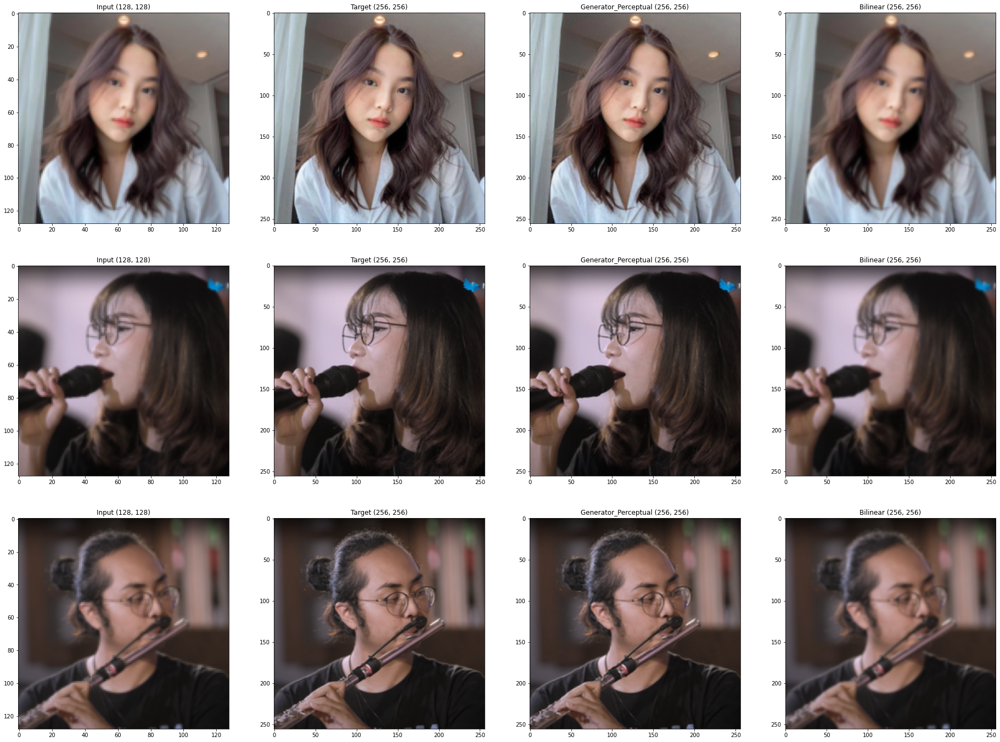

In [57]:
plot_samples(sample_x, sample_y, generator, 'Generator_Perceptual')

# IX. Model Saving
> we will save the model weights and the model architecture to presistent storage so we can deploy the model later

In [58]:
generator.save('models/generator_gan.h5')
discriminator.save('models/discriminator_gan.h5')

# X. Model Inference
> since we're using custom loss calculation we will need to presist the custom loss function too

In [59]:
generator = tf.keras.models.load_model('models/generator_gan.h5', custom_objects={'composite_loss':composite_loss, 'perceptual_loss':perceptual_loss})
discriminator =  tf.keras.models.load_model('models/discriminator_gan.h5')

> to better conclude the results we will use uploaded images to test the model this image is the original image from the internet without resizing, and we will see what the model capable of doing in high resolution space

> as i see the model was generating sharp images but there is some problem along the way the input image contain JPEG compression artifacts this can be a problem because the model think it was a feature and amplify the noise to counter this problem we will use a denoiser to remove the artifacts

Saving sample_256.png to sample_256 (4).png


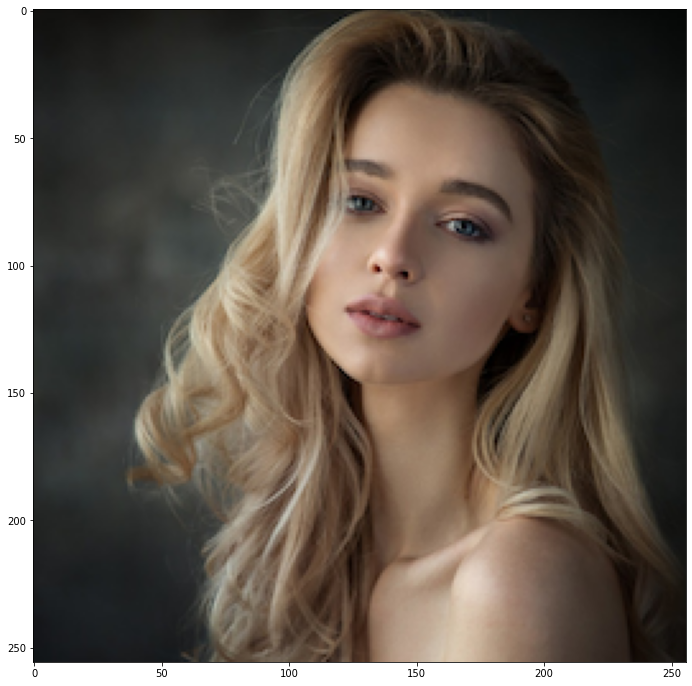

In [60]:
uploaded = files.upload()
img_key = list(uploaded.keys())[0]

input_img = Image.open(BytesIO(uploaded[img_key]))
input_img = np.asarray(input_img)[None, :, :, :3]

plt.figure(figsize=(12, 12))
plt.imshow(input_img[0])

> to better evaluate the output let's plot them side by side
> the denoised image is good for me, and i can safely say that this project is successful

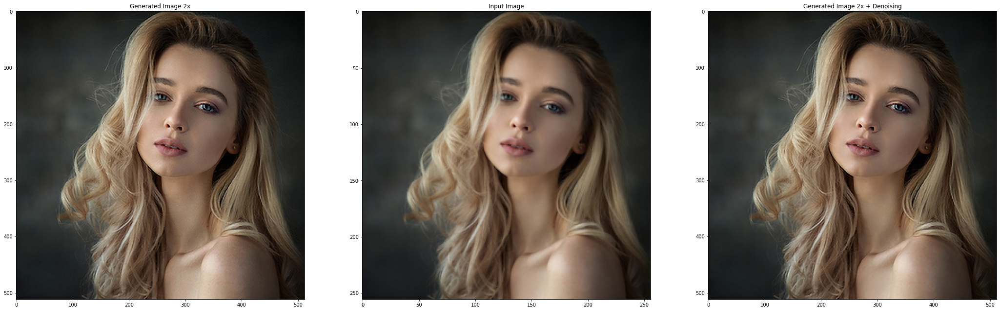

In [61]:
img = np.asarray(generator(input_img)[0], dtype=np.uint8)
dst = cv2.fastNlMeansDenoisingColored(img, None, h=3, hColor=3, templateWindowSize=21, searchWindowSize=3)

fig, ax = plt.subplots(1, 3, figsize=(12 * 3, 12))
ax[0].imshow(img)
ax[1].imshow(input_img[0])
ax[2].imshow(dst)

ax[0].set_title('Generated Image 2x')
ax[1].set_title('Input Image')
ax[2].set_title('Generated Image 2x + Denoising');

# XI. Summary

> since this project is complicated one we need some way to approache the problem in the simpler form in this case i choose to conquere the problem using devide and conquere strategy by deviding each step individualy first is to understand why the problem occure in this case the compression was done to save some space on the presistent disk and by learning why it was done we can have some guideline about how to reproduce the output of the compression then applying the transformation into known target so we can have set of data `taget` and `input`

> by understanding how the compression was performed and the objective of the compression we can have another insigh about how to inverse the transformation by this i mean we know that compression only effect high frequency detail this because we as humand are more conscious about dominant structure  in the visual / image and more forgiving when it come about small detail

> after knowing what the compressiong doing to the image we can conclude that color is not the absolute metric when it come to increasing the resolution of image but structural too

> picking correct dataset in this case because i was using my own dataset i need to think what is the best example for my model to learn in this sample i choose 3 video because 1 video was recorded on the indoor with constant lighting and one because it is on the outdoor with mean more optical bluring occure on the background and the lighing is dynamic because the set use color cycle light and one because it was edited and filtered to have more likeness of vintage video and much optical blur was happend on the video too because the use short focal leght when recording thats why i choose thoose 3 video

> those 3 video only yeild 900 ish image with frame rate of 1 this is a problem for a deeplearning model since i only have very small dataset to train with but here i employ another technique to increase the Variation of the data by using paches instead of the whole picture to save memory and faster training time and more diverse input

> after preprocesing was done we have 30_000 pair of data i think whis was big enough for our problem 

> having 30_000 sample of 128 x 128 on 3 color channel (30_000 x 128 x 128 x 3) can lead to some problem witch is how we store them all in the memory (RAM) in this case i was employing tf.data infrastructure to manage data pipeline and achieve very high performance while iterating 30_000 data only took 30s and subsequence call the time was reduce to 15s or half of original time

> the generator model was defined and have 107 layers with 1 milion parameter to train that was build with Residual Architecture in mind because this model is known to have best performance on image to image translation domain 

> the hyper parameter was specificly choosen by employing trial and error technique in this case i can guarantee that i have done more that 1000x training and tuning the parameter because of the complexity of the model came overfitting thats why we need to carefuly pick the right param to make training more stable and faster

> training does't take long time since we have large data in this case it was actualy almost infinity since i perform random cropping on the fly but still i pick 32 * num_example to train so it more predictable and not wasting any time,  
this time saving is one of the effect of carefully picking hyper parameter

> the model was trained with multiple step and no longger needing a long running epoch that why i only train the model with 4-8 epoch at a time

> after model was trained for the first time we can see that the output was soft and not real like image then after looking into the loss function we can conclude that it is the core of the loss function to better forgiving on the high frequency detail and more on overal pixel accuracy 

> the SSIM loss was employed to tacle the first problem because of the mse was not capable to dictate structural similarity of the output and target

> the new loss function was able to generate more crisp images but still not real life like image

> another solution was came by define another model we can train the new model to distinguise between real sample and generated sample and we can perform negative loss function to generator so the generator is amble to trick dicriminator to think that its output was real image this was done to encourage the generator to resemble real sample feature

> after everyhing was done we can save the model and doing some inference and the model still performing surprisingly well with the new sample input it's has more fidelity than mse and strong structural similarity with some nice texture on it

> but the model also amplifying the noise on the image this is because no de-noising done on the target output because i want another network to perform that exclusively

> for this project i will only use kmean image filtering to de-noise the output and it yeild nice output
---
> ## Model Limitation
> Because the size of the model we cannot perform upscaling on high-resolution image because of memory limitation

> and this model was never optimize to do upscaling with high level of noise on the input and it tend to overly sample the noise

> and for some case the model produce some high frequency pattern in sub pixel domain this is because how the convolution was done but because the hyper-tuning it's very subtle now